In [1]:
%load_ext autoreload
%autoreload 2

**This notebook is a first inspection of the words used in the extraction. It aims to gets my hands on the data and to quick test off-the-shelf approaches.**


Let's keep in mind:
In the project, we hope to leverage NLP methods to:
- Increase the reliability of the insight:
    - removing false positive: keywords used out of context
    - detect potential keywords forgotten
- Enrich the information:
    - Evaluate the quality of the information
    - Extract speaker name
    - Understand the sentiment associated to the extract
    - Understand the topic tackled beyond the keyword


## Table of Content:
* [ 1. Imports & Data Processing](#import)
* [2. EDA](#eda)
* [3. Off-the-shelf Sentiment Subjectivity analysis](#sent)



# 1. Imports & Data Processing <a class="anchor" id="import"></a>

In [2]:
import sys
sys.path.append("..")

import pandas as pd
from quotaclimat.data_processing.read_format_deduplicate import read_and_format_all_data_dump
import nltk
# pre trained sentiment analysis
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from textblob import Blobber
from textblob_fr import PatternTagger, PatternAnalyzer

# text processing
from collections import Counter
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
nltk.download('punkt')

from nltk.stem.snowball import FrenchStemmer

# topic modeling
import gensim

# vizuals
import plotly.graph_objects as go
from wordcloud import WordCloud

nltk.download("stopwords")
stopwords = nltk.corpus.stopwords.words('french')
stopwords.append('<unk>')


[nltk_data] Downloading package punkt to /Users/estelle/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/estelle/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## Clean up text
Data should be in the root of the repo in data/keywords

In [3]:
# data dumps from extract
df_all = read_and_format_all_data_dump()

# saving time next run:
#df_all.to_csv('df_all.csv')
#df_all = pd.read_csv('df_all.csv')
# channel data
top_n = 15
channels = pd.read_excel('../data/channels.xlsx')
top_channels = channels.head(top_n)["CHANNEL_NAME"].tolist()

In [4]:
len(df_all)

85646

## Feature engineering

In [5]:
df_all['nb_of_words'] = df_all['text'].str.split().str.len()
df_all['text_without_stopwords'] = df_all['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))
df_all['nb_of_words_without_stopwords'] = df_all['text_without_stopwords'].str.split().str.len()

# stemming # lemmatization TODO: double check output
stemmer = FrenchStemmer()
df_all['text_stemmed'] = df_all['text_without_stopwords'].apply(lambda t: stemmer.stem(t))


#tokenizer 
df_all['text_token'] = df_all['text_stemmed'].apply(lambda t: word_tokenize(t, language='french'))

# saving time next run:
#df_all.to_csv('df_all_processed.csv')
#df_all = pd.read_csv('df_all_processed.csv')

# vectorizers
#vectorizer = CountVectorizer()
#df_X = pd.DataFrame(vectorizer.fit_transform(df_all["text_stemmed"]).todense())
#df_X.columns = vectorizer.get_feature_names()

tfidf = TfidfVectorizer()
df_X_tfidf = pd.DataFrame(tfidf.fit_transform(df_all["text_stemmed"]).todense())
df_X_tfidf.columns = tfidf.get_feature_names()

# save time next run:
#df_X_tfidf.to_pickle('df_X_tfidf.pkl')



/Users/estelle/.pyenv/versions/3.10.2/envs/quotaclimat/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [7]:
df_X_tfidf.to_pickle('df_X_tfidf.pkl')


# 2. EDA  <a class="anchor" id="EDA"></a>
## Number of words per sample


In [8]:
fig = go.Figure()
fig.add_trace(go.Box(y=df_all['nb_of_words'], x=df_all['media']))
fig.update_layout(title='Number of words per extract per media', width=800, height=350)
fig.show()
fig = go.Figure()
fig.add_trace(go.Box(y=df_all['nb_of_words'], x=df_all['keyword']))
fig.update_layout(title='Number of words per extract per media', width=800, height=350)
fig.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df_all['nb_of_words_without_stopwords'], x=df_all['media']))
fig.update_layout(title='Number of words (without stopwords) per extract per media', width=800, height=350)
fig.show()
fig = go.Figure()
fig.add_trace(go.Box(y=df_all['nb_of_words_without_stopwords'], x=df_all['keyword']))
fig.update_layout(title='Number of words (without stopwords) per extract per media', width=800, height=350)
fig.show()

## Words cloud and counts

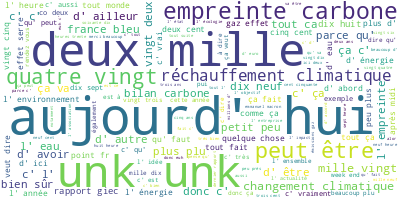

In [6]:
long_string = ','.join(list(df_all['text_stemmed'].values))
wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=3, contour_color='steelblue')
wordcloud.generate(long_string)
wordcloud.to_image()

# 3. Sentiment // Subjectivity  <a class="anchor" id="3sub"></a>

In [37]:
## try out sid
nltk.download('vader_lexicon')
sid = SentimentIntensityAnalyzer()

sid.polarity_scores(df_all.loc[0, 'text'].iloc[0])

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/estelle/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

In [53]:
# try out blobber
tb = Blobber(pos_tagger=PatternTagger(), analyzer=PatternAnalyzer())
df_all['polarity'] = df_all['text_without_stopwords'].apply(lambda txt: tb(txt).polarity)
df_all['subjectivity'] = df_all['text_without_stopwords'].apply(lambda txt: tb(txt).subjectivity)
df_all['sentiment'] = df_all['text_without_stopwords'].apply(lambda txt: tb(txt).sentiment)

In [66]:
fig = go.Figure()
fig.add_trace(go.Box(y=df_all['subjectivity'], x=df_all['media']))
fig.update_layout(title='subjectivity (without stopwords) per extract per media', width=800, height=350)
fig.show()
fig = go.Figure()
fig.add_trace(go.Box(y=df_all['subjectivity'], x=df_all['keyword']))
fig.update_layout(title='subjectivity (without stopwords) per extract per keywords', width=800, height=350)
fig.show()

In [83]:
fig = go.Figure()
df_top_channel = df_all[df_all.channel_name.isin(top_channels)]
df_top_channel_radio = df_top_channel[df_top_channel.media == 'Radio']
df_top_channel_tv = df_top_channel[df_top_channel.media == 'TV']

fig.add_trace(go.Box(y=df_top_channel_radio['subjectivity'], x=df_top_channel_radio['channel_name'], name='Radio', marker_color = 'lightseagreen'))
fig.add_trace(go.Box(y=df_top_channel_tv['subjectivity'], x=df_top_channel_tv['channel_name'], name='TV', marker_color = 'indianred'))

fig.update_layout(title='Distribution of the subjectivity (1 is subjectif, 0 is objectif) of the extracts (without stopwords) per channel (top 15)')
fig.show()

# 4. Off-the-shelf topic modeling


In [8]:
# TODO: check for the french version?
corpus = df_all['text_stemmed']

## pre-process corpus
lst_corpus = []
for string in corpus:
    lst_words = string.split()
    lst_grams = [" ".join(lst_words[i:i + 2]) for i in range(0, 
                     len(lst_words), 2)]
    lst_corpus.append(lst_grams)


In [11]:
id2word = gensim.corpora.Dictionary(lst_corpus)
extracts = [id2word.doc2bow(word) for word in lst_corpus] 
## train LDA
nb_topics = 5
lda_model = gensim.models.ldamodel.LdaModel(corpus=extracts, id2word=id2word, num_topics=nb_topics, random_state=30, alpha='auto', per_word_topics=True)

2022-10-28 08:35:17.941 INFO    gensim.corpora.dictionary: adding document #0 to Dictionary<0 unique tokens: []>
2022-10-28 08:35:20.328 INFO    gensim.corpora.dictionary: adding document #10000 to Dictionary<485171 unique tokens: ['<unk> rien', 'alcool fumé', 'arriver décroissance', 'cannab', 'très bien']...>
2022-10-28 08:35:22.526 INFO    gensim.corpora.dictionary: adding document #20000 to Dictionary<818979 unique tokens: ['<unk> rien', 'alcool fumé', 'arriver décroissance', 'cannab', 'très bien']...>
2022-10-28 08:35:24.593 INFO    gensim.corpora.dictionary: adding document #30000 to Dictionary<1116711 unique tokens: ['<unk> rien', 'alcool fumé', 'arriver décroissance', 'cannab', 'très bien']...>
2022-10-28 08:35:26.879 INFO    gensim.corpora.dictionary: adding document #40000 to Dictionary<1393341 unique tokens: ['<unk> rien', 'alcool fumé', 'arriver décroissance', 'cannab', 'très bien']...>
2022-10-28 08:35:29.398 INFO    gensim.corpora.dictionary: adding document #50000 to Dict

In [13]:
# to dataframe
lst_dics = []
for i in range(0, nb_topics):
    lst_tuples = lda_model.get_topic_terms(i)
    for tupla in lst_tuples:
        lst_dics.append({"topic":i, "id":tupla[0], 
                         "word":id2word[tupla[0]], 
                         "weight":tupla[1]})
df_all_topics = pd.DataFrame(lst_dics, 
                         columns=['topic','id','word','weight'])
    


In [19]:
for idx, topic in lda_model.print_topics(-1):
   print('Topic: {} \nWords: {}'.format(idx, topic))

# some don't make that much sense, the cropus is probably too small or nb of topics too large

2022-10-28 08:40:41.807 INFO    gensim.models.ldamodel: topic #0 (0.099): 0.023*"<unk> <unk>" + 0.003*"france bleu" + 0.001*"trente-huit vingt" + 0.001*"douze trente-huit" + 0.001*"j' agis" + 0.001*"zéro quatre" + 0.001*"messages mail" + 0.001*"soixante douze" + 0.001*"quatre soixante" + 0.001*"<unk>"
2022-10-28 08:40:41.824 INFO    gensim.models.ldamodel: topic #1 (1.293): 0.005*"deux mille" + 0.005*"<unk> <unk>" + 0.004*"aujourd' hui" + 0.003*"france bleu" + 0.002*"changement climatique" + 0.002*"l' actualité" + 0.002*"point fr" + 0.002*"sobriété énergétique" + 0.002*"emmanuel macron" + 0.001*"heures trente"
2022-10-28 08:40:41.848 INFO    gensim.models.ldamodel: topic #2 (0.030): 0.000*"cette école" + 0.000*"bec lièvre" + 0.000*"fête foraine" + 0.000*"d' annecy" + 0.000*"ville ville" + 0.000*"retour normale" + 0.000*"anne charlotte" + 0.000*"enjeux écologiques" + 0.000*"locaux a" + 0.000*"tirs défense"
2022-10-28 08:40:41.875 INFO    gensim.models.ldamodel: topic #3 (0.035): 0.000*"

Topic: 0 
Words: 0.023*"<unk> <unk>" + 0.003*"france bleu" + 0.001*"trente-huit vingt" + 0.001*"douze trente-huit" + 0.001*"j' agis" + 0.001*"zéro quatre" + 0.001*"messages mail" + 0.001*"soixante douze" + 0.001*"quatre soixante" + 0.001*"<unk>"
Topic: 1 
Words: 0.005*"deux mille" + 0.005*"<unk> <unk>" + 0.004*"aujourd' hui" + 0.003*"france bleu" + 0.002*"changement climatique" + 0.002*"l' actualité" + 0.002*"point fr" + 0.002*"sobriété énergétique" + 0.002*"emmanuel macron" + 0.001*"heures trente"
Topic: 2 
Words: 0.000*"cette école" + 0.000*"bec lièvre" + 0.000*"fête foraine" + 0.000*"d' annecy" + 0.000*"ville ville" + 0.000*"retour normale" + 0.000*"anne charlotte" + 0.000*"enjeux écologiques" + 0.000*"locaux a" + 0.000*"tirs défense"
Topic: 3 
Words: 0.000*"hui devant" + 0.000*"ville lyon" + 0.000*"sans l'" + 0.000*"quoi va" + 0.000*"derrière cette" + 0.000*"l' algérie" + 0.000*"bfm lyon" + 0.000*"d' interpeller" + 0.000*"programme a" + 0.000*"grande fête"
Topic: 4 
Words: 0.006*"a